# Generación de señales ECG con GAN (LSTM)

> Objetivo: entrenar un modelo GAN con un generador basado en LSTM para sintetizar señales ECG de una clase específica (p. ej., NSR).

## Flujo del notebook
- Preparación del entorno y librerías
- Configuración (seed, dispositivo)
- Carga y exploración de datos
- Creación del DataLoader
- Definición de los modelos (Generator y Discriminator)
- Rutina de entrenamiento y monitoreo de pérdidas
- Guardado de modelos y métricas
- Notas y siguientes pasos

In [1]:
import os
import time

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW, Adam

In [3]:
class Config:
    csv_path = ''
    seed = 2021
    device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

def seed_everything(seed: int):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
    
config = Config()
seed_everything(config.seed)
config.device

'cuda:0'

## Entorno y dispositivo

- Se fija la semilla para asegurar reproducibilidad.
- Se detecta automáticamente si hay GPU disponible.
- La celda siguiente imprime el estado de la GPU (nvidia-smi) para confirmar recursos.

In [4]:
!nvidia-smi

Fri Nov  7 14:06:51 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.10              Driver Version: 581.29         CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060 Ti     On  |   00000000:01:00.0  On |                  N/A |
|  0%   48C    P8             10W /  160W |    3491MiB /   8188MiB |     12%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Carga de datos

- Definimos la ruta al CSV con señales ECG preprocesadas.
- El archivo esperado es `ECG_DATASET/dataset_ekg_df.csv`.
- `label` contiene la etiqueta textual y `class` la codificación numérica.
- Las columnas de señal son todas excepto las dos últimas (`[:-2]`).

In [5]:
path = "../../ECG_DATASET/dataset_ekg_df.csv"
config.csv_path = path

config.csv_path

'../../ECG_DATASET/dataset_ekg_df.csv'

In [6]:
df = pd.read_csv(config.csv_path)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,3592,3593,3594,3595,3596,3597,3598,3599,label,class
0,-0.064515,-0.059515,-0.029515,-0.019515,-0.014515,-0.014515,-0.019515,-0.009515,0.020485,0.030485,...,0.130485,0.120485,0.110485,0.110485,0.120485,0.135485,0.130485,0.115485,NSR,0
1,0.245485,0.250485,0.240485,0.230485,0.240485,0.240485,0.250485,0.235485,0.215485,0.220485,...,0.375485,0.375485,0.385485,0.370485,0.355485,0.340485,0.335485,0.315485,NSR,0
2,0.130485,0.125485,0.110485,0.100485,0.105485,0.115485,0.120485,0.095485,0.090485,0.085485,...,-0.144515,-0.164515,-0.159515,-0.169515,-0.189515,-0.204515,-0.204515,-0.204515,NSR,0
3,-0.499515,-0.409515,-0.394515,-0.419515,-0.469515,-0.504515,-0.559515,-0.589515,-0.614515,-0.639515,...,-0.709515,-0.699515,-0.689515,-0.669515,-0.684515,-0.694515,-0.694515,-0.674515,NSR,0
4,0.245485,0.265485,0.255485,0.250485,0.230485,0.235485,0.245485,0.280485,0.270485,0.275485,...,0.110485,0.120485,0.130485,0.140485,0.135485,0.120485,0.110485,0.120485,NSR,0


### Vista rápida y ejemplo de señal

- Mostramos una señal de la clase NSR para verificar formato y escala.
- El eje X representa muestras; el eje Y, amplitud normalizada.

Text(0.5, 0, 'muestras')

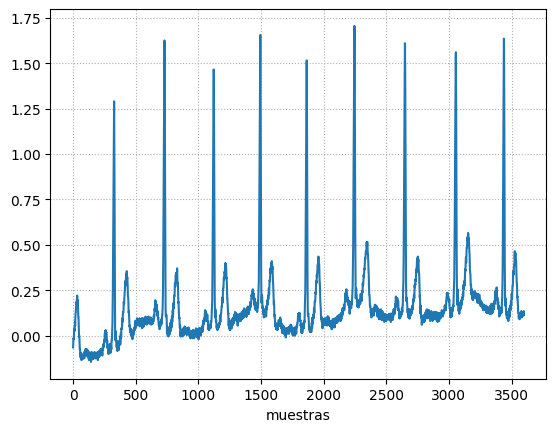

In [7]:
df[df["label"]=="NSR"].iloc[0,:-2].plot()
plt.grid(ls=":")
plt.xlabel("muestras")

## DataLoader personalizado

Esta sección construye un `Dataset` y un `DataLoader` para una clase específica:

- Filtra por `label` (ej. 'NSR').
- Convierte las señales a tensores `float32` con forma `(1, longitud)` para la red.
- Devuelve pares `(signal, target)` donde `target` es el índice numérico (`class`).
- `get_dataloader` vuelve a leer el CSV para permitir generar múltiples loaders de distintas clases si se quisiera.

In [ ]:
# class ECGDataset(Dataset):

#     def __init__(self, df):
#         self.df = df
#         self.data_columns = self.df.columns[:-2].tolist()
#         # Pre-convertir los datos a arrays numpy para evitar warnings
#         self.signals = self.df[self.data_columns].values.astype('float32')
#         self.targets = self.df['class'].values.astype('int64')

#     def __getitem__(self, idx):
#         signal = torch.from_numpy(self.signals[idx]).unsqueeze(0)
#         target = torch.tensor(self.targets[idx], dtype=torch.long)
#         return signal, target

#     def __len__(self):
#         return len(self.df)

# def get_dataloader(label_name, batch_size):
    
#     dataset = ECGDataset(df)
#     dataloader = DataLoader(dataset=dataset, batch_size=batch_size, num_workers=0)
#     return dataloader

In [30]:
df = pd.read_csv(config.csv_path)
df = df.loc[df['label'] == "NSR"].copy()
df.reset_index(drop=True, inplace=True)

data_columns = df.columns[:-2].tolist()
signals = df[data_columns].values.astype('float32')
signals = signals[:,:signals.shape[1]//2]
targets = df['class'].values.astype('int64')


fs = 360  # Frecuencia de muestreo en Hz
N= signals.shape[1]
t = np.arange(N)*1/fs

signals

array([[-0.06451476, -0.05951476, -0.02951476, ...,  0.12048524,
         0.12048524,  0.10048524],
       [ 0.24548525,  0.25048524,  0.24048524, ...,  0.22048524,
         0.22048524,  0.23048525],
       [ 0.13048524,  0.12548524,  0.11048524, ...,  0.00548524,
        -0.03951476, -0.04451476],
       ...,
       [-0.46451476, -0.46451476, -0.46451476, ..., -0.48451474,
        -0.48451474, -0.49951476],
       [-0.5345148 , -0.51451474, -0.5345148 , ..., -0.40951476,
        -0.39451477, -0.38451475],
       [ 0.5154852 ,  0.50548524,  0.50548524, ...,  0.14048524,
         0.15048525,  0.14548524]], dtype=float32)

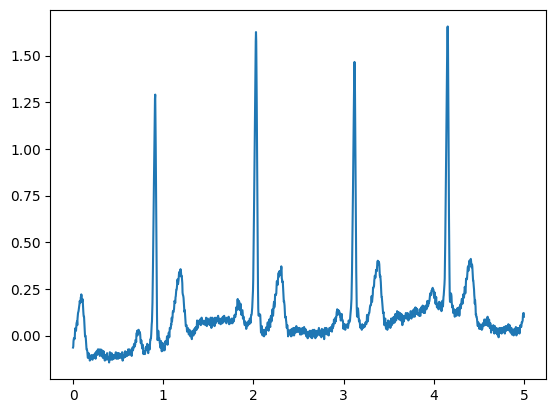

In [31]:
plt.plot(t,signals[0,:])

In [32]:
X_min = signals.min()
X_max = signals.max()
X_dataset_normalized = 2 * (signals - X_min) / (X_max - X_min) - 1

print(f"Original range: [{X_min:.3f}, {X_max:.3f}]")
print(f"Normalized range: [{X_dataset_normalized.min():.3f}, {X_dataset_normalized.max():.3f}]")

Original range: [-2.155, 3.040]
Normalized range: [-1.000, 1.000]


In [33]:
# dataloader = get_dataloader(label_name='NSR', batch_size=96)

# print(len(dataloader))
# x,y = next(iter(dataloader))
# x.shape, y.shape

In [34]:
import torch
import torch.nn as nn
from torch.optim import Adam, AdamW
from torch.utils.data import DataLoader, Dataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
seed = 2025
torch.manual_seed(seed)
np.random.seed(seed)

class SineWaveDataset:
    def __init__(self, data):
        self.data = torch.tensor(data, dtype=torch.float32)

    def __len__(self):
        return self.data.shape[0]

    def __getitem__(self, idx):
        return self.data[idx]
    

def get_dataloader(data, batch_size=32, shuffle=True):
    dataset = SineWaveDataset(data)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)
    return dataloader


batch_size = 96
dataloader = get_dataloader(X_dataset_normalized, batch_size=batch_size, shuffle=True)

dataloader

## GAN

In [35]:
# Mejorado: Inicialización de pesos + Arquitectura más profunda
def weights_init(m):
    """Inicialización de pesos según DCGAN"""
    classname = m.__class__.__name__
    if classname.find('Linear') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        if m.bias is not None:
            nn.init.constant_(m.bias.data, 0)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator mejorado (más capas, mejor regularización)
class Generator(nn.Module):
    def __init__(self, noise_dim=128, output_dim=200):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(noise_dim, 256), 
            nn.BatchNorm1d(256), 
            nn.LeakyReLU(0.2, True),
            
            nn.Linear(256, 512), 
            nn.BatchNorm1d(512), 
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.3),
            
            nn.Linear(512, 1024), 
            nn.BatchNorm1d(1024), 
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.3),
            
            nn.Linear(1024, 1024), 
            nn.BatchNorm1d(1024), 
            nn.LeakyReLU(0.2, True),
            
            nn.Linear(1024, output_dim),
            nn.Tanh()  # Salida en [-1, 1]
        )
        
    def forward(self, z): 
        return self.model(z)

# Discriminator mejorado (más capaz, sin BatchNorm)
class Discriminator(nn.Module):
    def __init__(self, input_dim=200):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 1024), 
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.3),
            
            nn.Linear(1024, 512), 
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.3),
            
            nn.Linear(512, 256), 
            nn.LeakyReLU(0.2, True),
            
            nn.Linear(256, 1)  # logits para BCEWithLogitsLoss
        )
        
    def forward(self, x): 
        return self.model(x.view(x.size(0), -1))

Epoch [50/5000], D Loss: 0.6169, G Loss: 2.7868
Epoch [100/5000], D Loss: 1.5349, G Loss: 6.5454


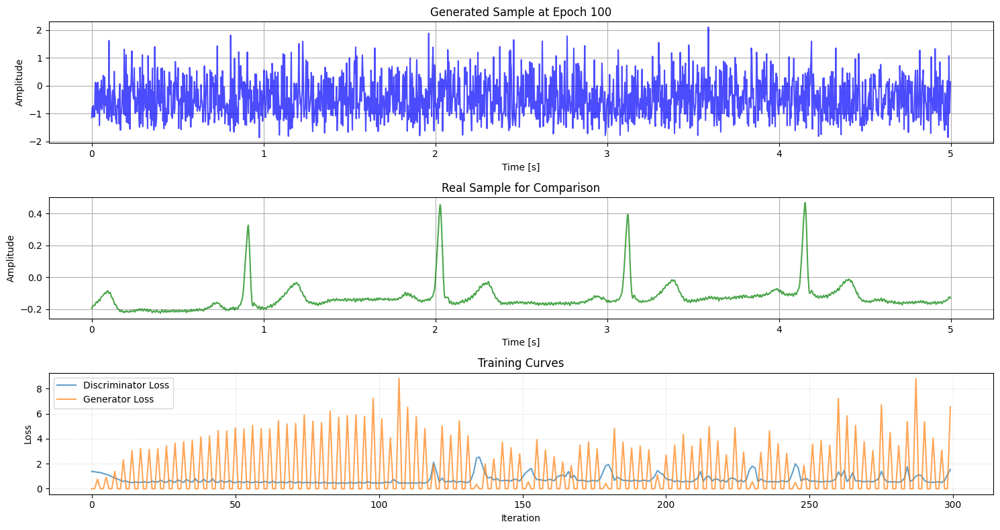

Epoch [150/5000], D Loss: 0.9016, G Loss: 2.3139
Epoch [200/5000], D Loss: 0.6104, G Loss: 1.8552


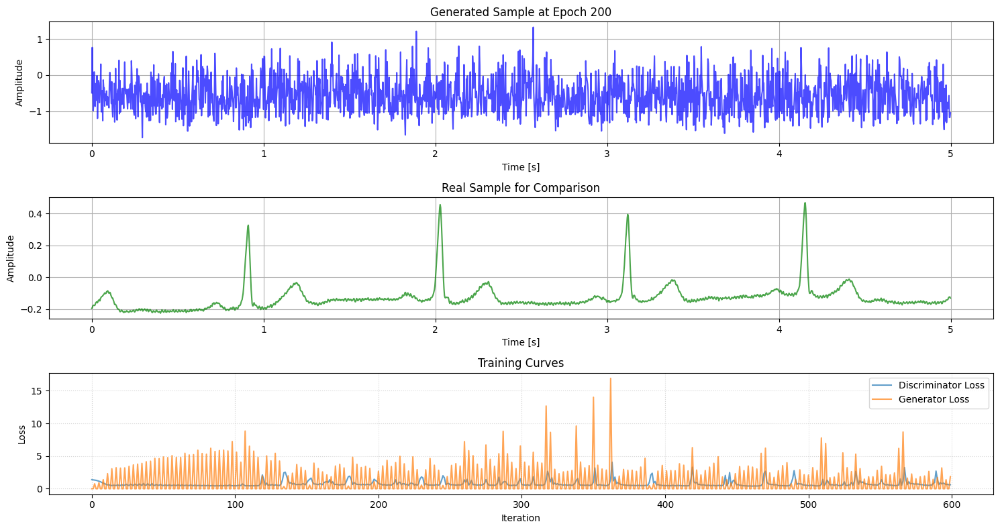

Epoch [250/5000], D Loss: 0.6149, G Loss: 1.7314
Epoch [300/5000], D Loss: 1.0324, G Loss: 2.9555


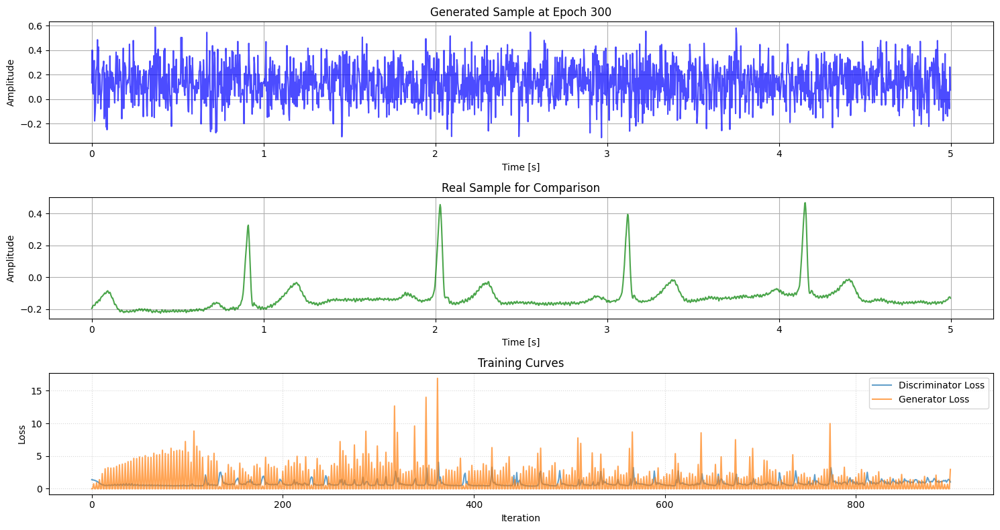

Epoch [350/5000], D Loss: 1.3198, G Loss: 0.9381
Epoch [400/5000], D Loss: 1.2812, G Loss: 0.8291


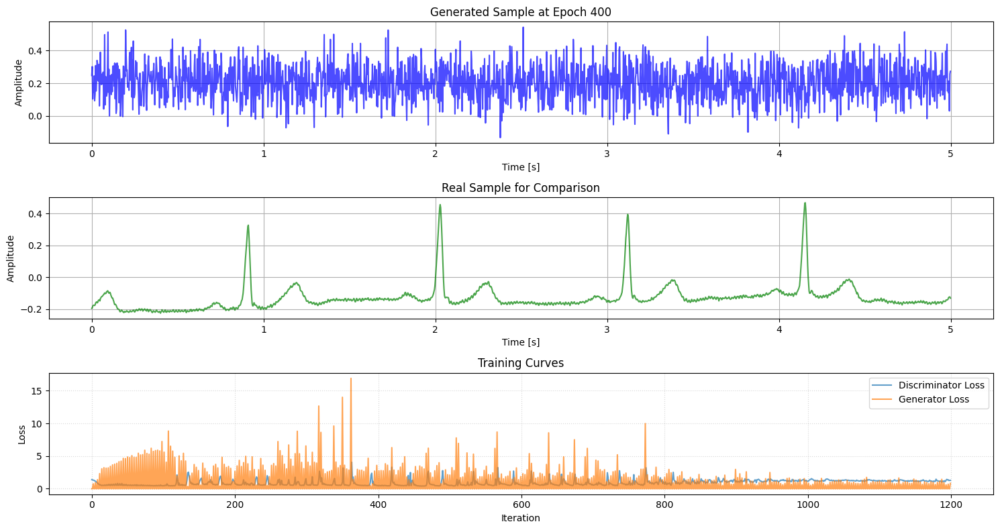

Epoch [450/5000], D Loss: 1.2045, G Loss: 0.8816
Epoch [500/5000], D Loss: 0.9148, G Loss: 0.9297


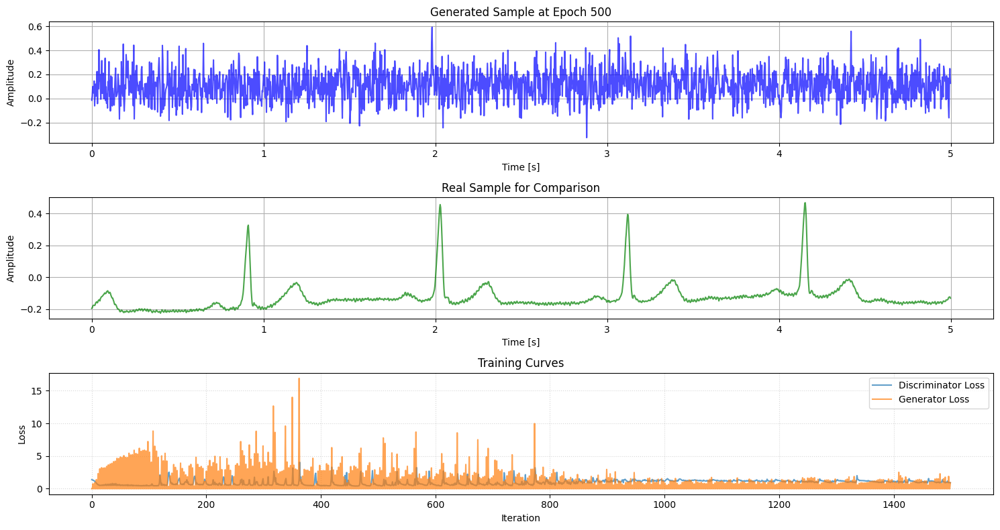

Epoch [550/5000], D Loss: 0.9258, G Loss: 1.6252
Epoch [600/5000], D Loss: 0.8590, G Loss: 1.3708


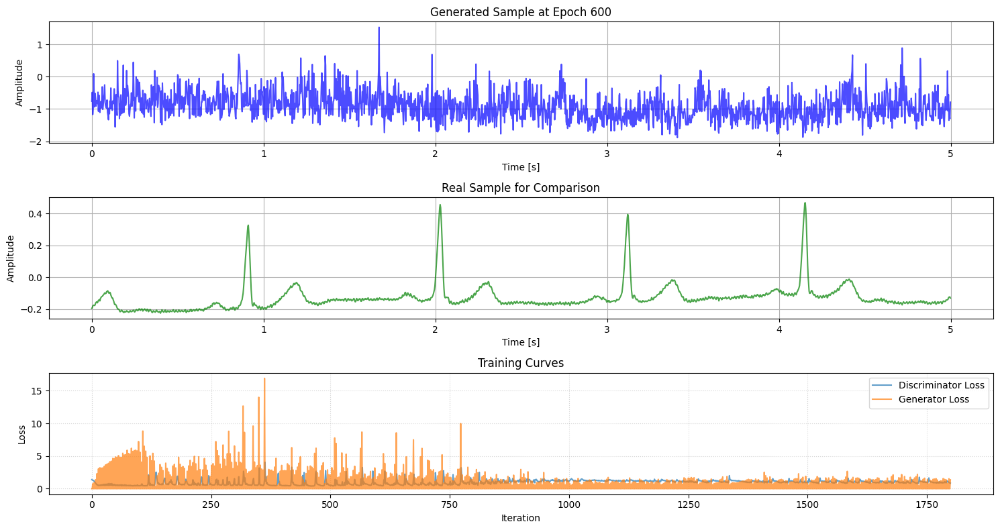

Epoch [650/5000], D Loss: 0.8235, G Loss: 1.6015
Epoch [700/5000], D Loss: 1.0214, G Loss: 1.6029


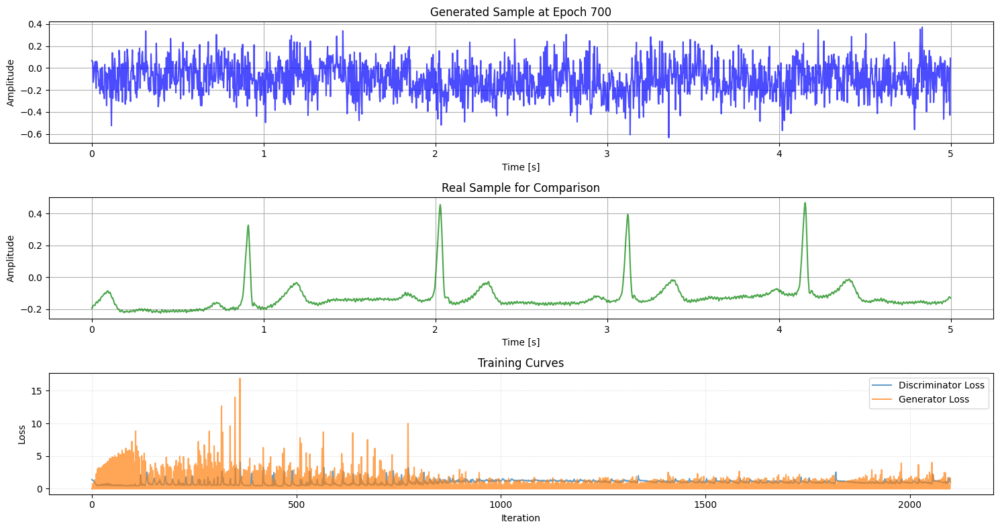

Epoch [750/5000], D Loss: 1.6251, G Loss: 0.9848
Epoch [800/5000], D Loss: 0.8868, G Loss: 2.2641


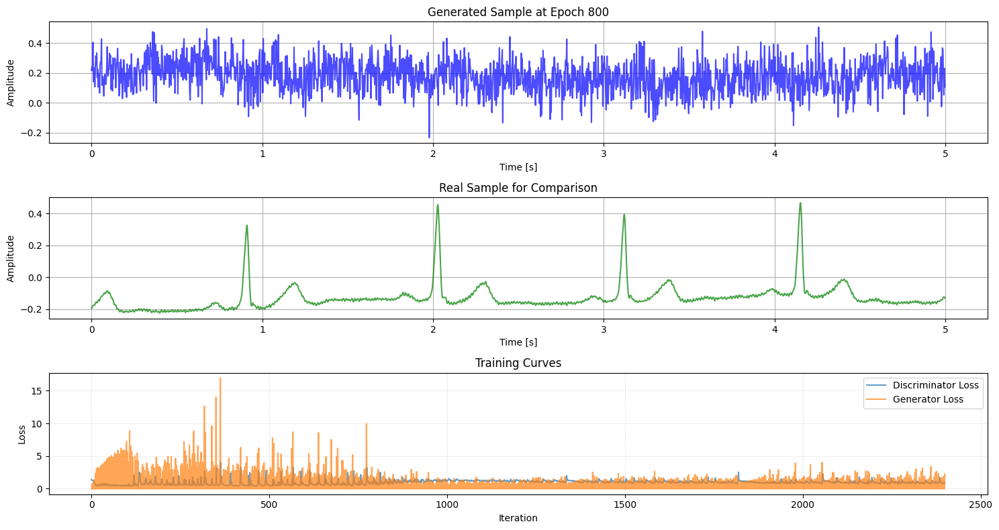

Epoch [850/5000], D Loss: 0.8077, G Loss: 1.5313
Epoch [900/5000], D Loss: 0.9873, G Loss: 1.1491


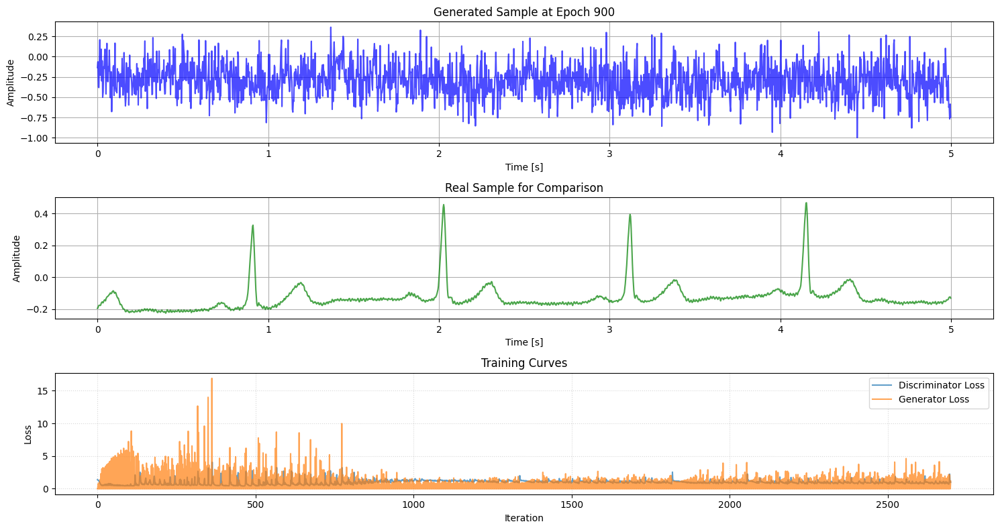

Epoch [950/5000], D Loss: 0.7589, G Loss: 3.4234
Epoch [1000/5000], D Loss: 0.9683, G Loss: 2.3740


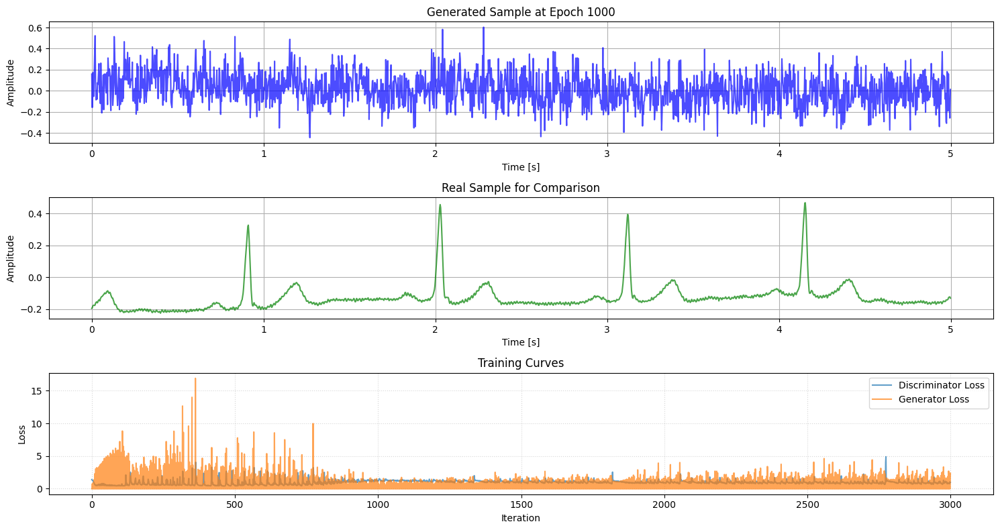

Epoch [1050/5000], D Loss: 0.8529, G Loss: 1.7789
Epoch [1100/5000], D Loss: 1.0078, G Loss: 1.8911


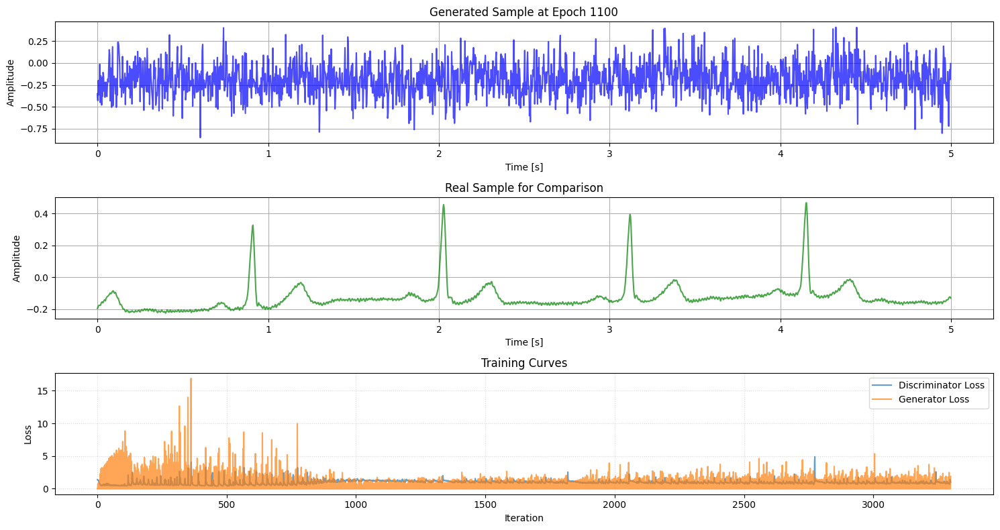

Epoch [1150/5000], D Loss: 0.9255, G Loss: 1.7444
Epoch [1200/5000], D Loss: 0.8756, G Loss: 2.2051


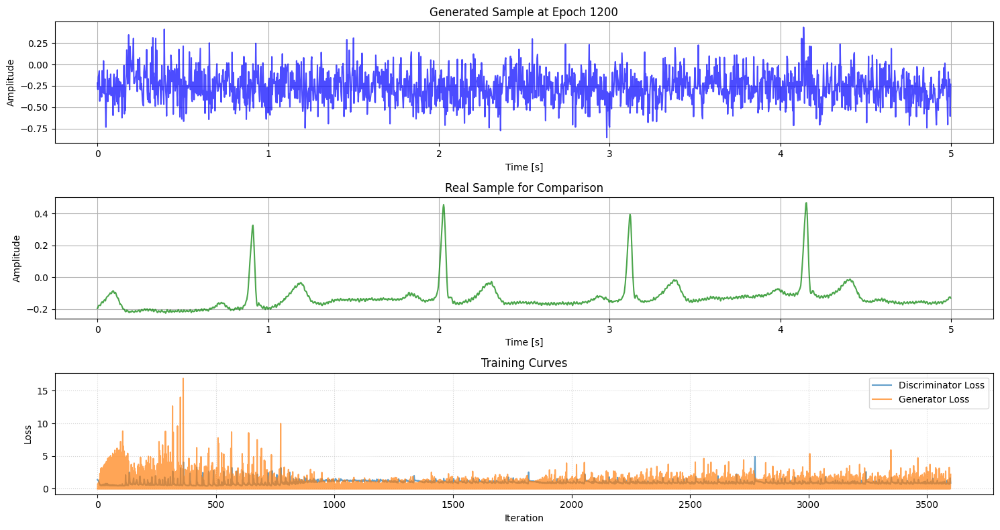

Epoch [1250/5000], D Loss: 0.9471, G Loss: 0.6071
Epoch [1300/5000], D Loss: 1.3991, G Loss: 0.7393


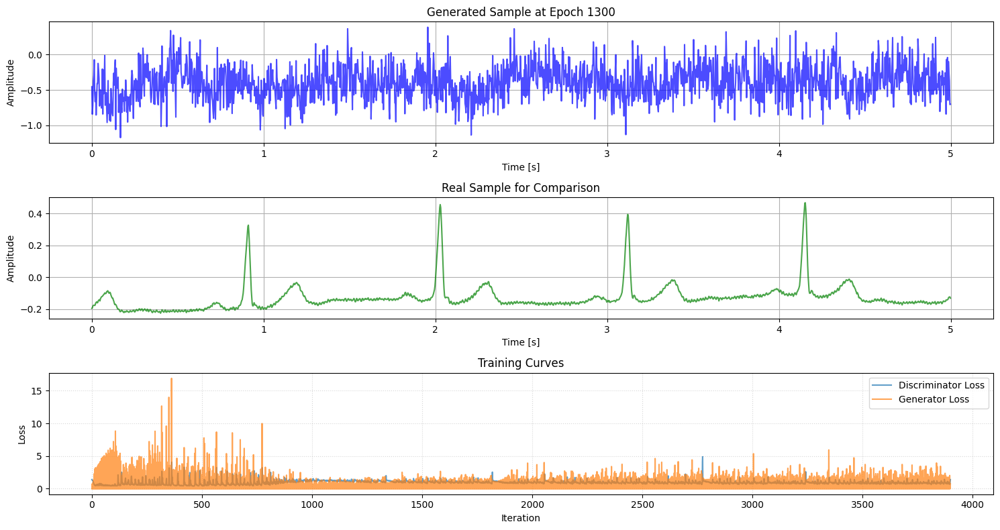

Epoch [1350/5000], D Loss: 0.7703, G Loss: 1.7245
Epoch [1400/5000], D Loss: 1.1015, G Loss: 1.2759


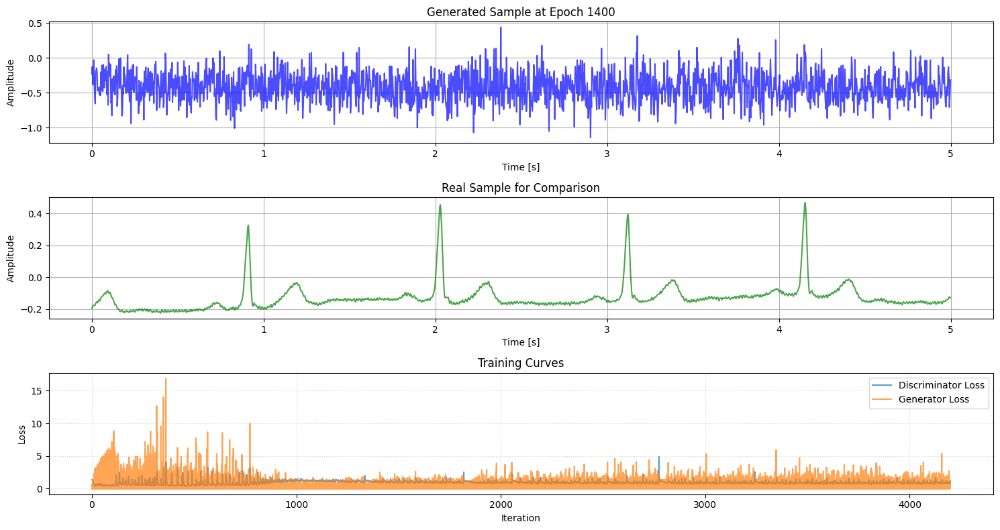

Epoch [1450/5000], D Loss: 0.8506, G Loss: 3.3963
Epoch [1500/5000], D Loss: 0.7287, G Loss: 1.1391


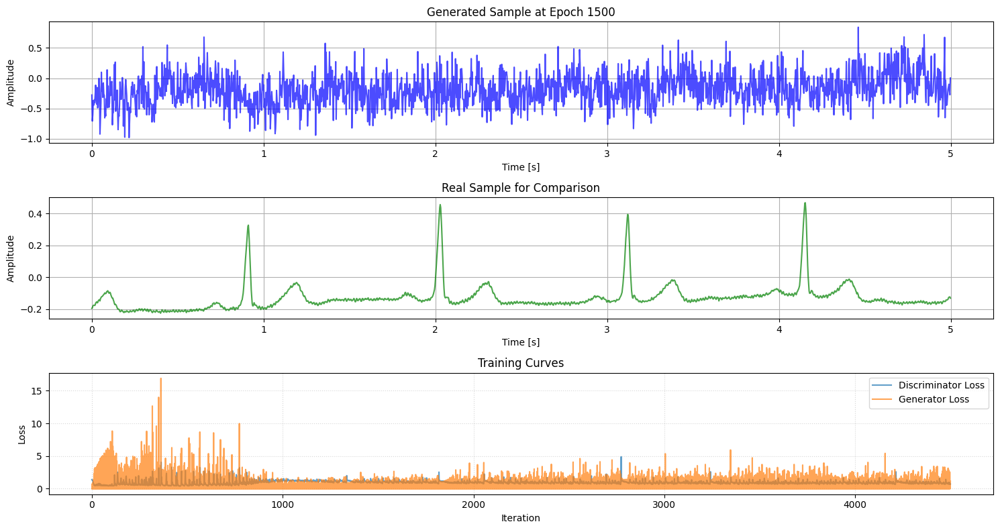

Epoch [1550/5000], D Loss: 1.4761, G Loss: 0.6970
Epoch [1600/5000], D Loss: 0.8995, G Loss: 1.6212


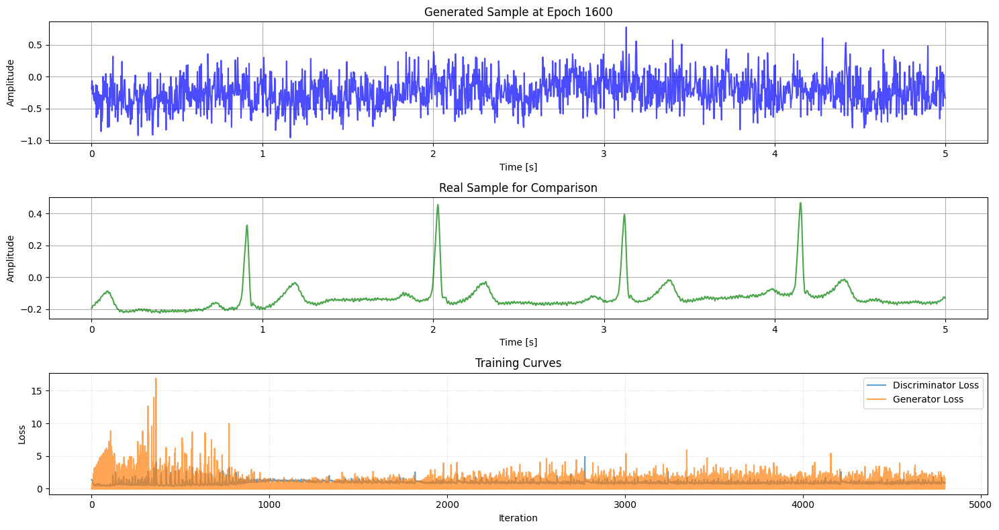

Epoch [1650/5000], D Loss: 1.2306, G Loss: 0.8164
Epoch [1700/5000], D Loss: 1.0366, G Loss: 1.3187


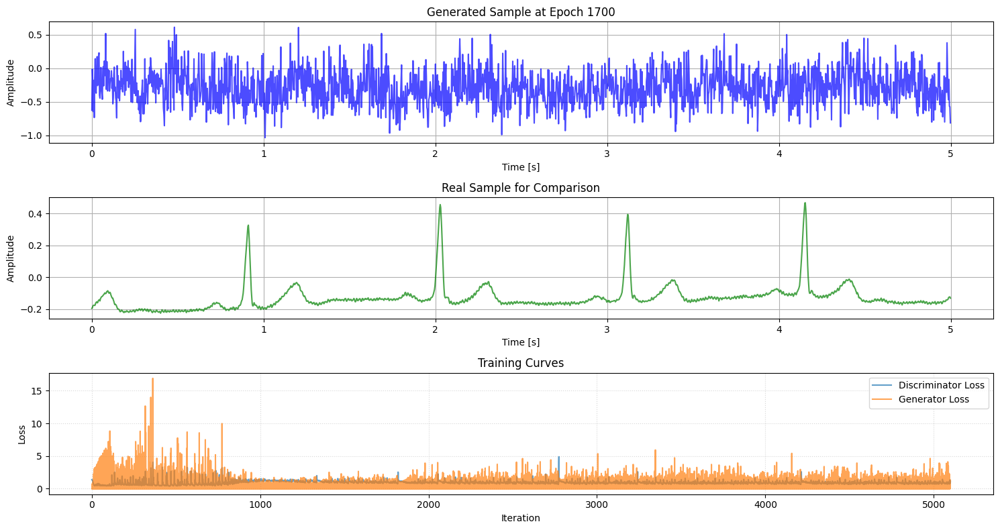

Epoch [1750/5000], D Loss: 0.8416, G Loss: 2.3429
Epoch [1800/5000], D Loss: 0.8017, G Loss: 1.2919


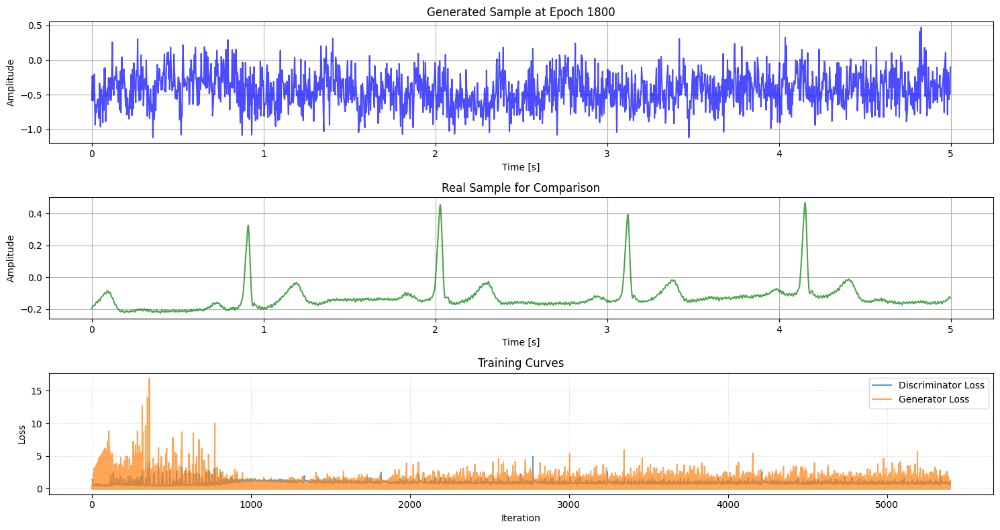

Epoch [1850/5000], D Loss: 0.6890, G Loss: 2.2089
Epoch [1900/5000], D Loss: 0.8387, G Loss: 1.6075


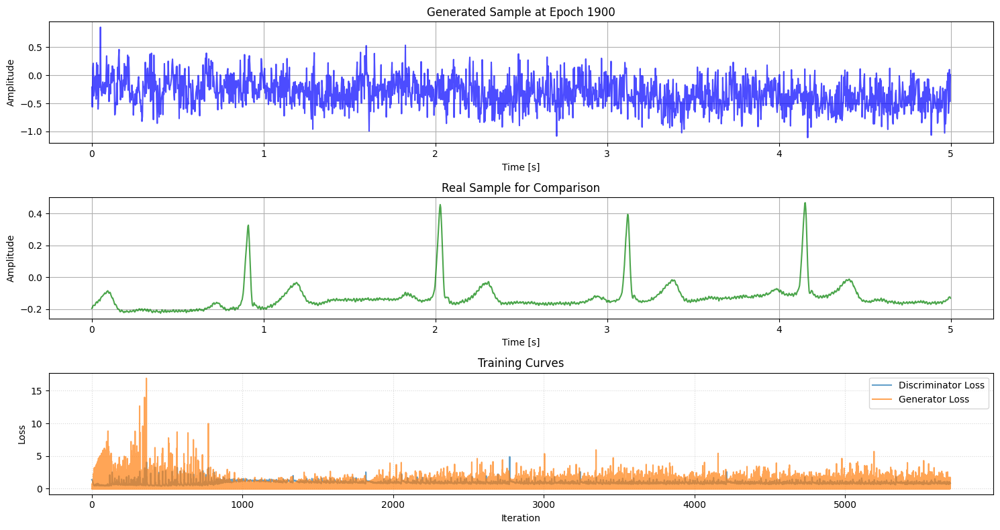

Epoch [1950/5000], D Loss: 0.9177, G Loss: 1.9446
Epoch [2000/5000], D Loss: 0.7097, G Loss: 2.2542


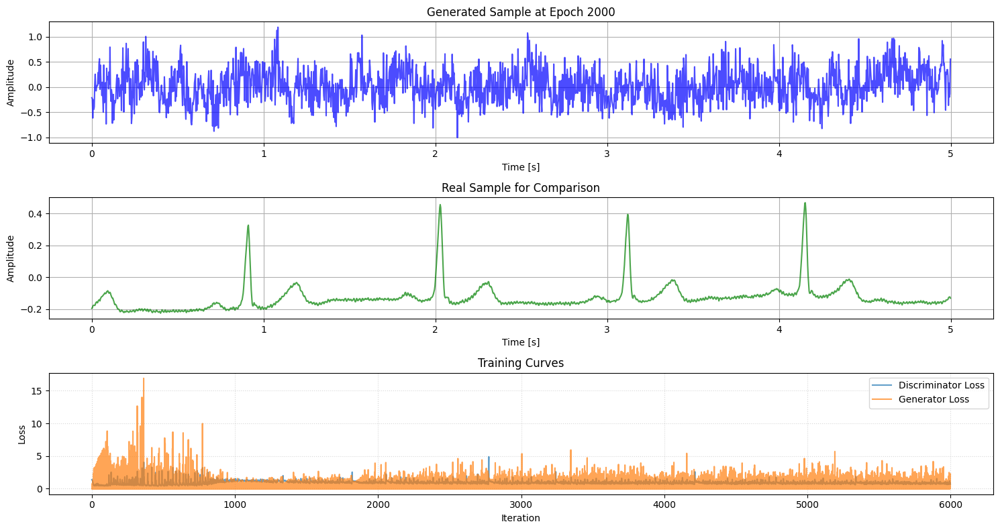

Epoch [2050/5000], D Loss: 1.0105, G Loss: 1.4891
Epoch [2100/5000], D Loss: 0.7552, G Loss: 3.3897


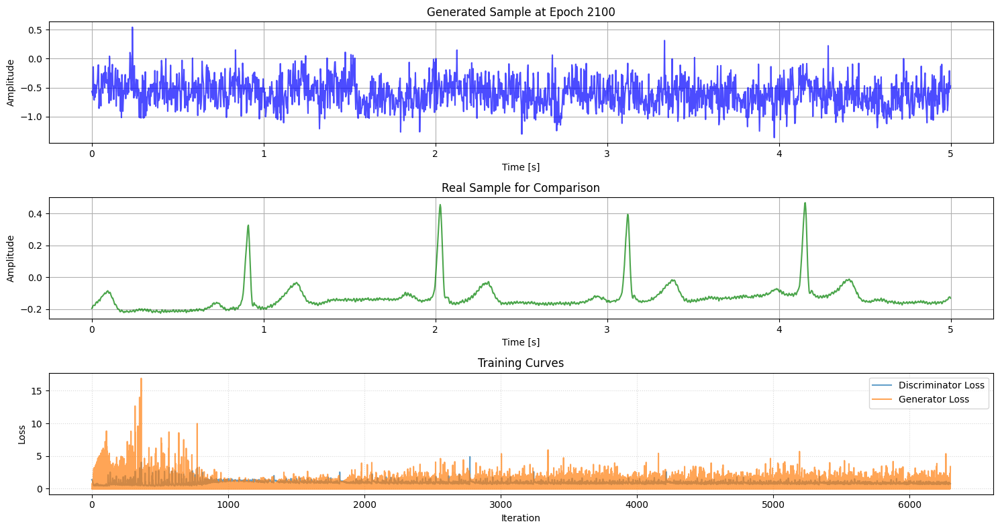

Epoch [2150/5000], D Loss: 0.9178, G Loss: 2.6362
Epoch [2200/5000], D Loss: 0.6907, G Loss: 2.0093


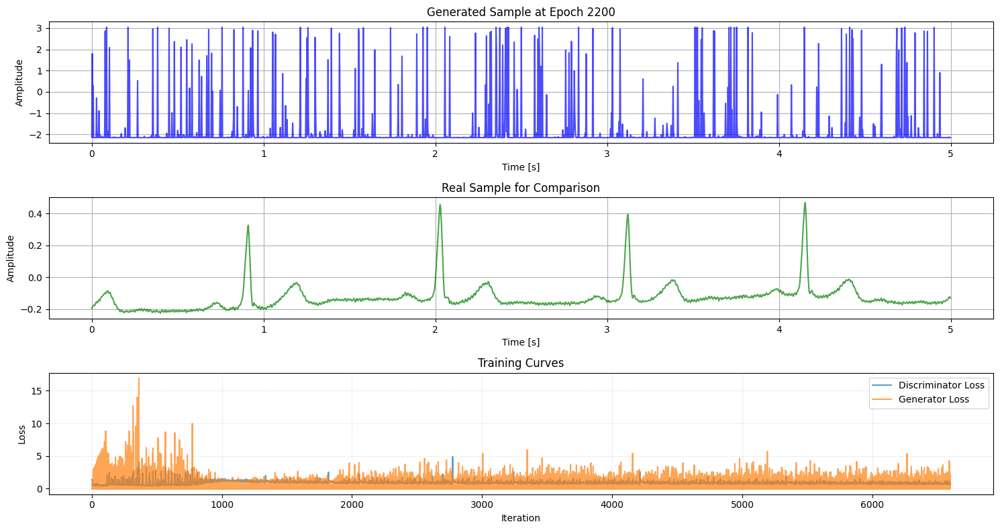

Epoch [2250/5000], D Loss: 0.7607, G Loss: 1.8968
Epoch [2300/5000], D Loss: 0.8774, G Loss: 2.2809


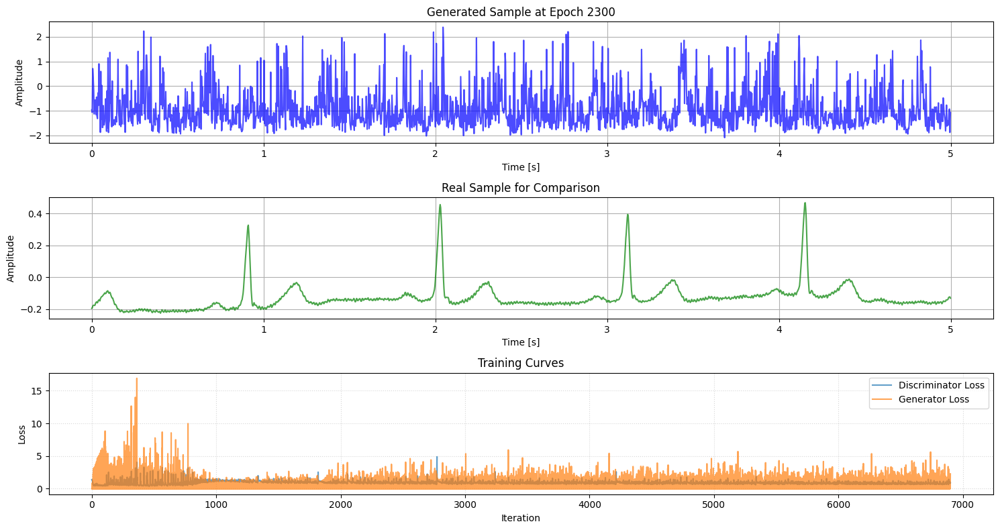

Epoch [2350/5000], D Loss: 0.7561, G Loss: 1.8670
Epoch [2400/5000], D Loss: 0.6967, G Loss: 2.9285


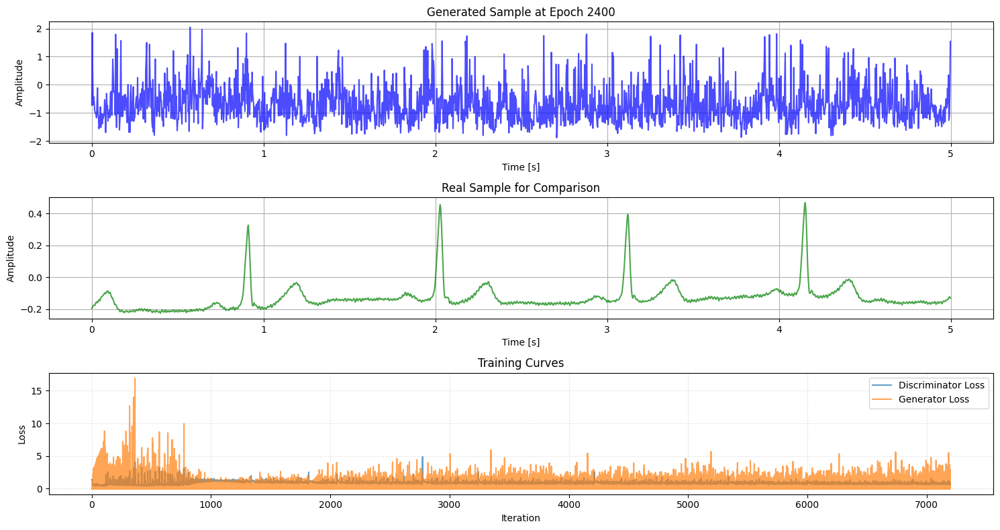

Epoch [2450/5000], D Loss: 0.7728, G Loss: 1.6805
Epoch [2500/5000], D Loss: 0.7239, G Loss: 3.1180


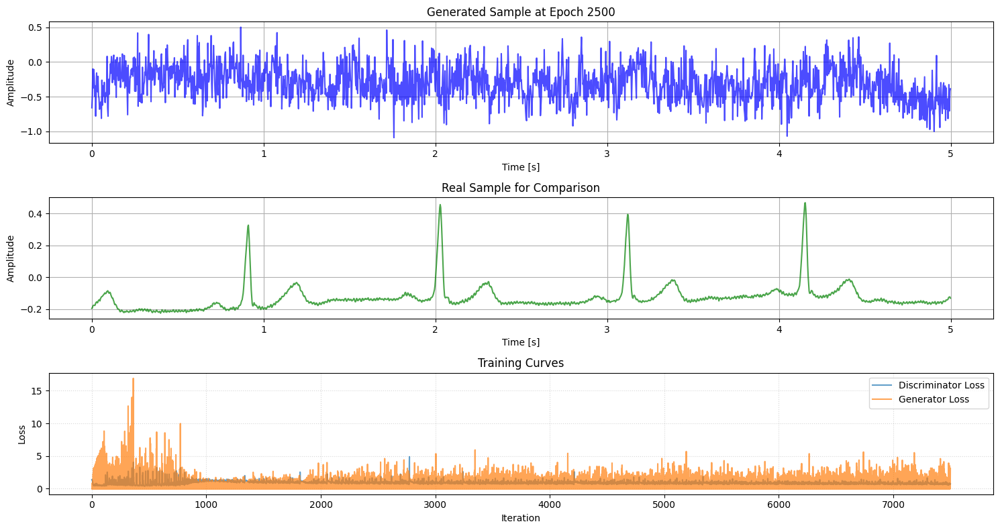

Epoch [2550/5000], D Loss: 0.8077, G Loss: 1.7860
Epoch [2600/5000], D Loss: 1.0971, G Loss: 1.6082


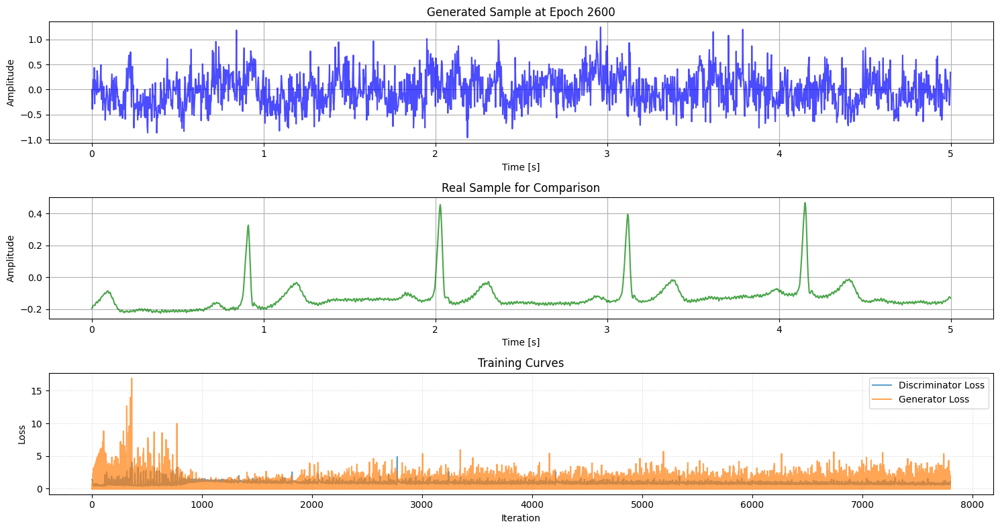

Epoch [2650/5000], D Loss: 0.6818, G Loss: 2.7200
Epoch [2700/5000], D Loss: 0.6750, G Loss: 3.7431


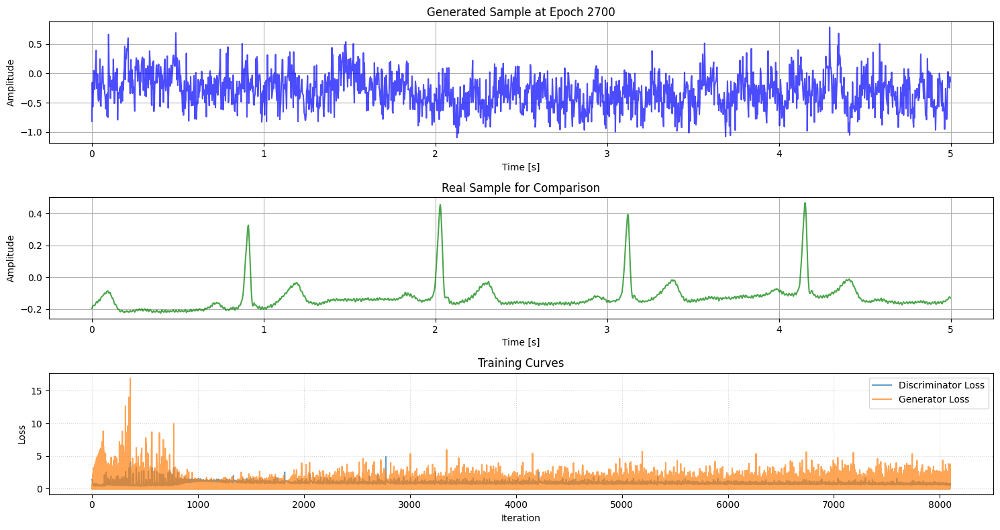

Epoch [2750/5000], D Loss: 0.7146, G Loss: 1.9468
Epoch [2800/5000], D Loss: 0.6238, G Loss: 2.6879


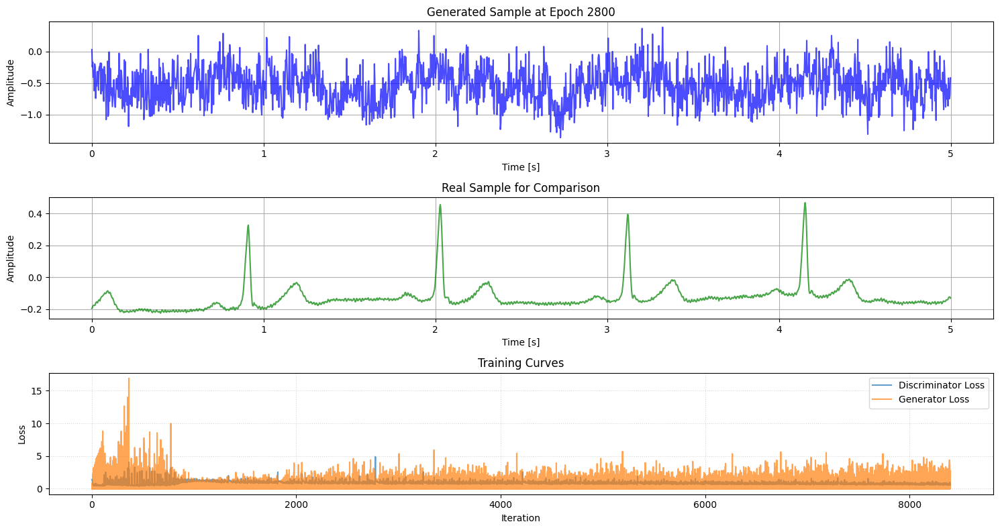

Epoch [2850/5000], D Loss: 0.6614, G Loss: 3.2898
Epoch [2900/5000], D Loss: 0.9292, G Loss: 1.5012


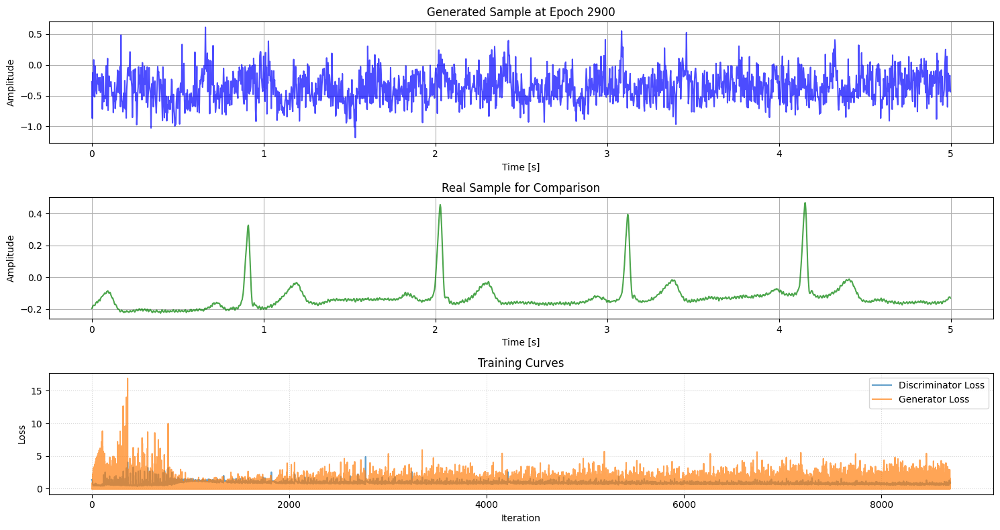

Epoch [2950/5000], D Loss: 0.7642, G Loss: 2.3290
Epoch [3000/5000], D Loss: 0.5905, G Loss: 2.4297


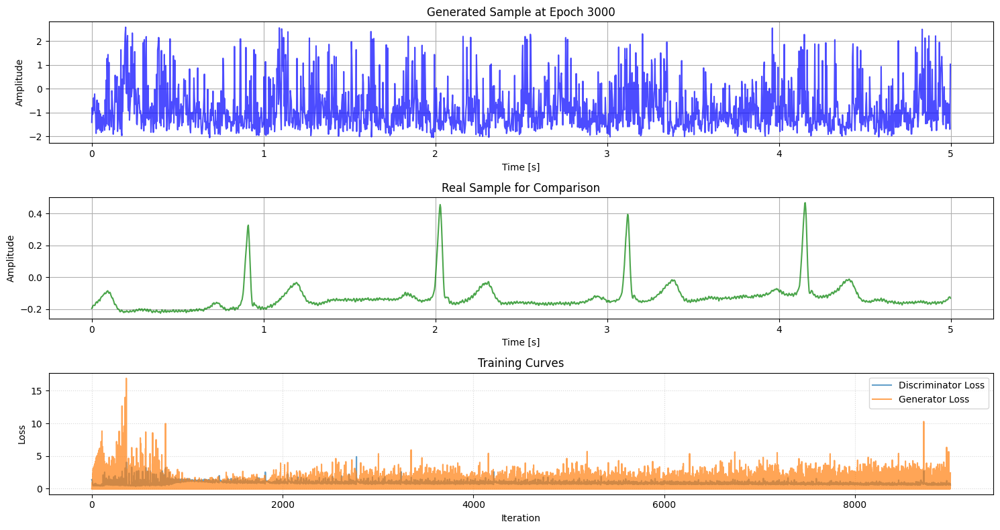

Epoch [3050/5000], D Loss: 0.5300, G Loss: 2.6157
Epoch [3100/5000], D Loss: 0.5782, G Loss: 2.2265


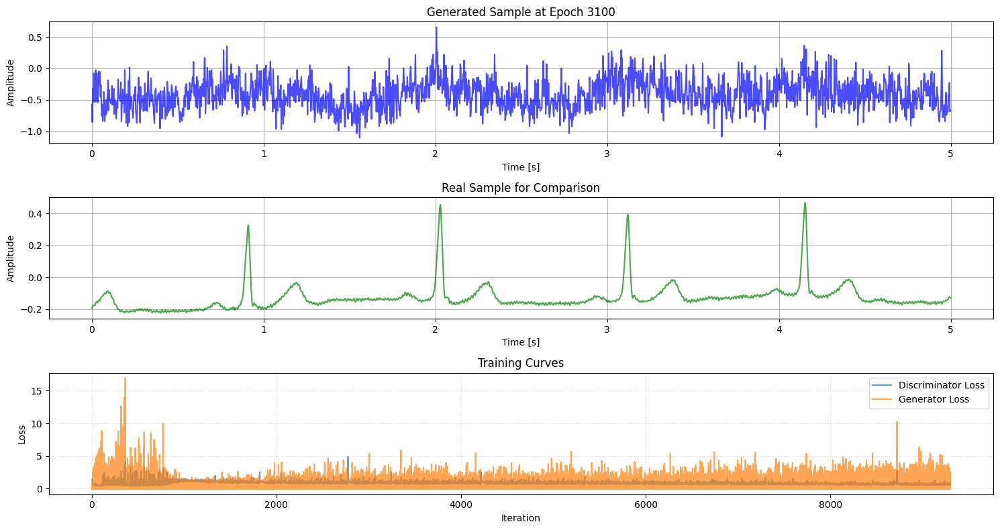

Epoch [3150/5000], D Loss: 0.6099, G Loss: 2.7990
Epoch [3200/5000], D Loss: 0.7191, G Loss: 3.3761


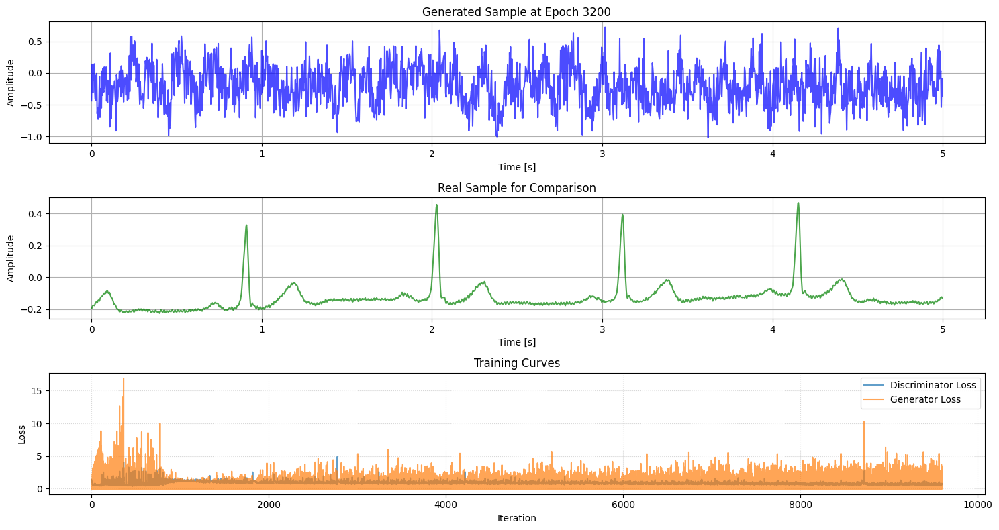

Epoch [3250/5000], D Loss: 0.7618, G Loss: 3.1864
Epoch [3300/5000], D Loss: 0.5787, G Loss: 2.6810


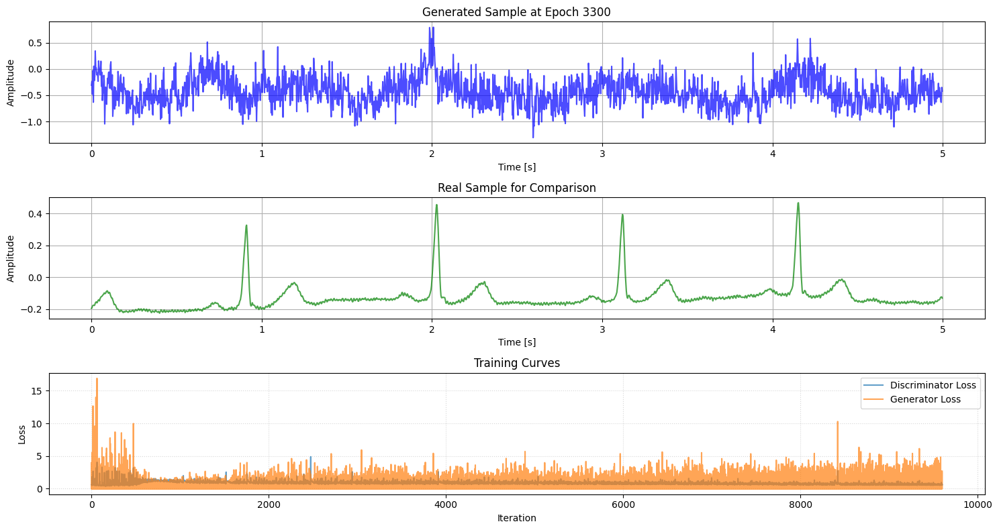

Epoch [3350/5000], D Loss: 0.6212, G Loss: 3.2407
Epoch [3400/5000], D Loss: 0.5232, G Loss: 3.4948


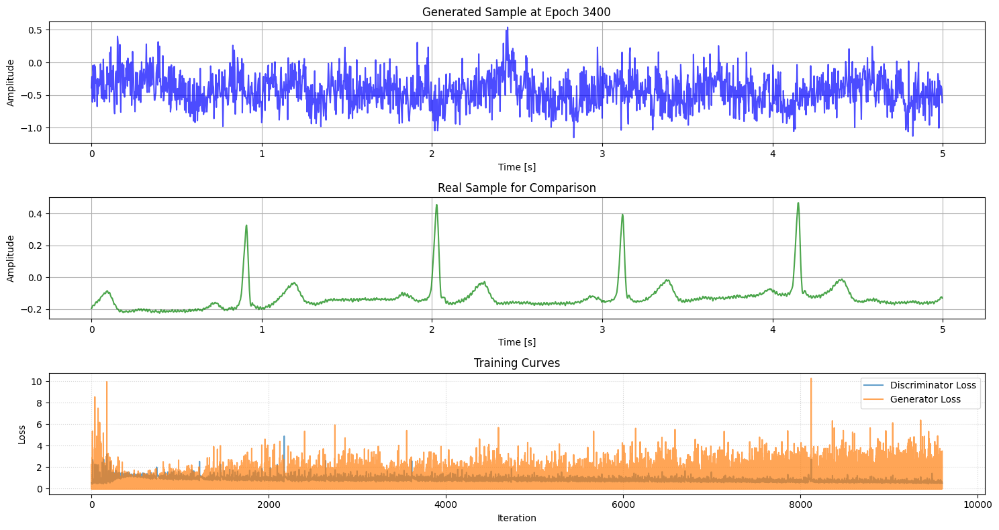

Epoch [3450/5000], D Loss: 0.6276, G Loss: 2.2178
Epoch [3500/5000], D Loss: 0.5850, G Loss: 2.7249


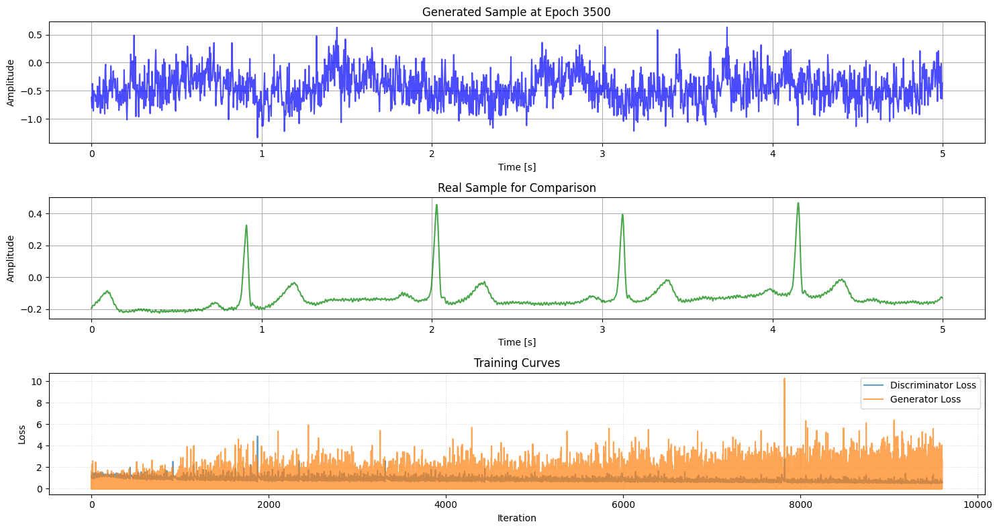

Epoch [3550/5000], D Loss: 0.5348, G Loss: 2.9278
Epoch [3600/5000], D Loss: 0.6987, G Loss: 2.5344


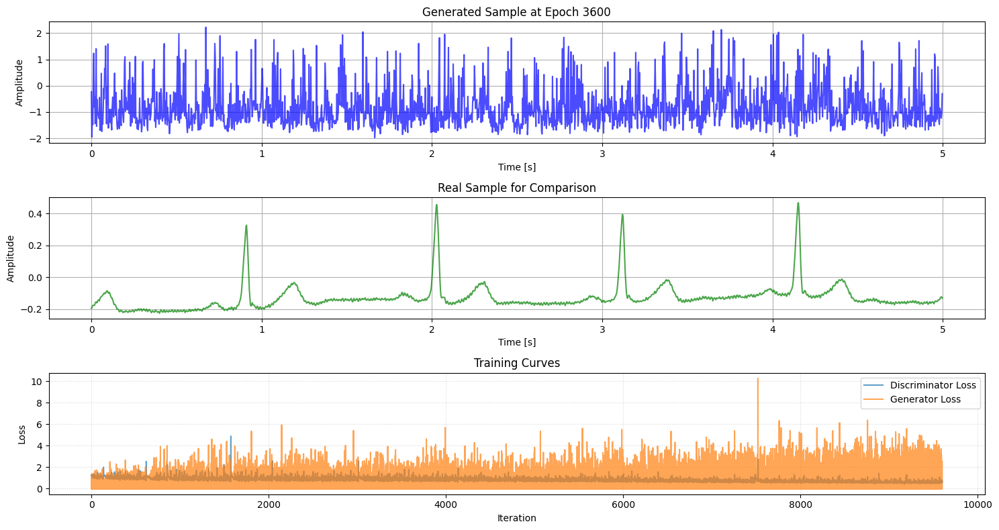

Epoch [3650/5000], D Loss: 0.5362, G Loss: 3.7605
Epoch [3700/5000], D Loss: 0.5580, G Loss: 6.0282


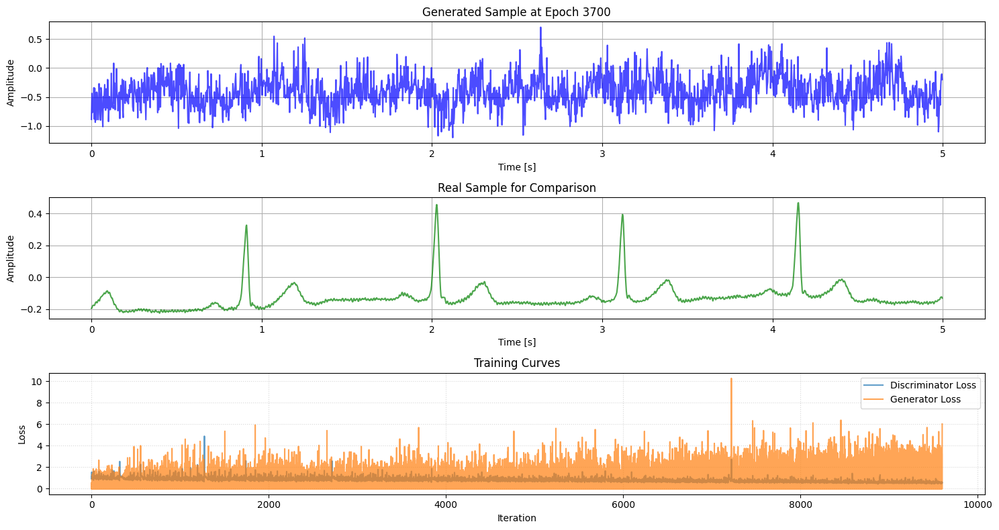

Epoch [3750/5000], D Loss: 0.5779, G Loss: 2.6110
Epoch [3800/5000], D Loss: 0.6309, G Loss: 3.7053


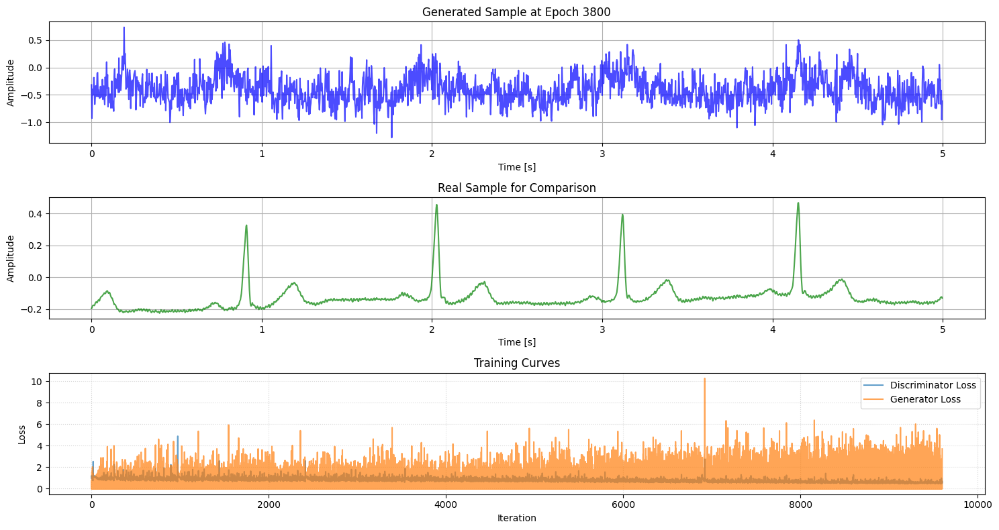

Epoch [3850/5000], D Loss: 0.4677, G Loss: 2.7082
Epoch [3900/5000], D Loss: 0.5210, G Loss: 6.3709


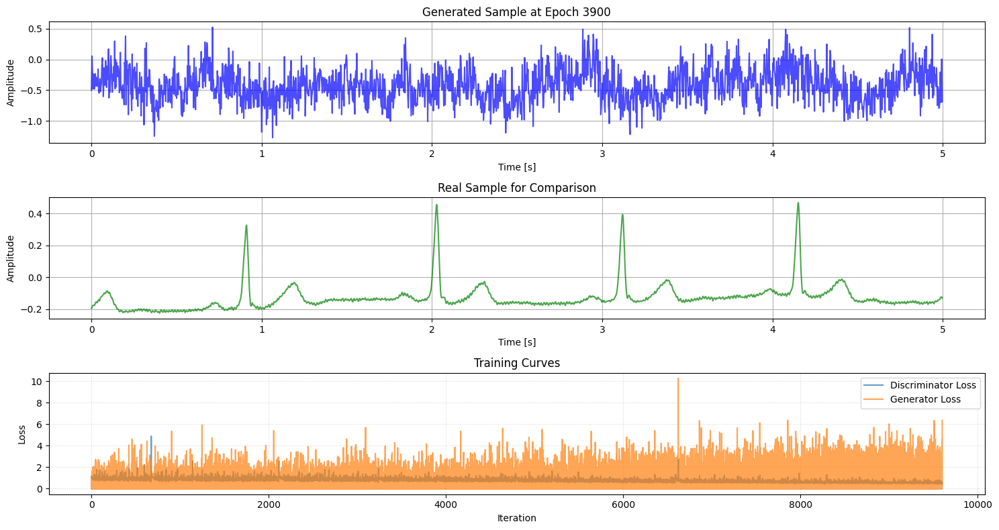

Epoch [3950/5000], D Loss: 0.5592, G Loss: 3.1399
Epoch [4000/5000], D Loss: 0.7031, G Loss: 3.0808


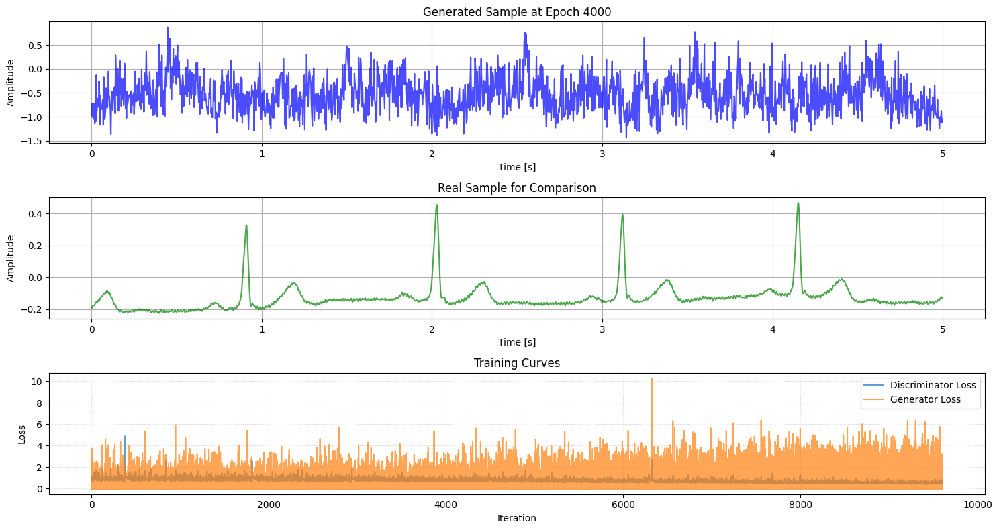

Epoch [4050/5000], D Loss: 0.4947, G Loss: 3.3913
Epoch [4100/5000], D Loss: 0.5396, G Loss: 3.7913


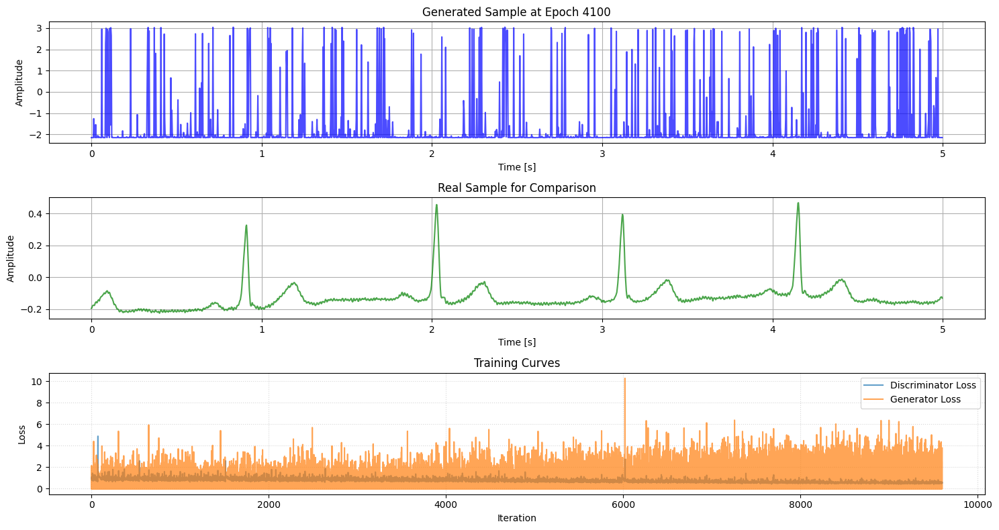

Epoch [4150/5000], D Loss: 0.6363, G Loss: 3.1525
Epoch [4200/5000], D Loss: 0.6036, G Loss: 6.5256


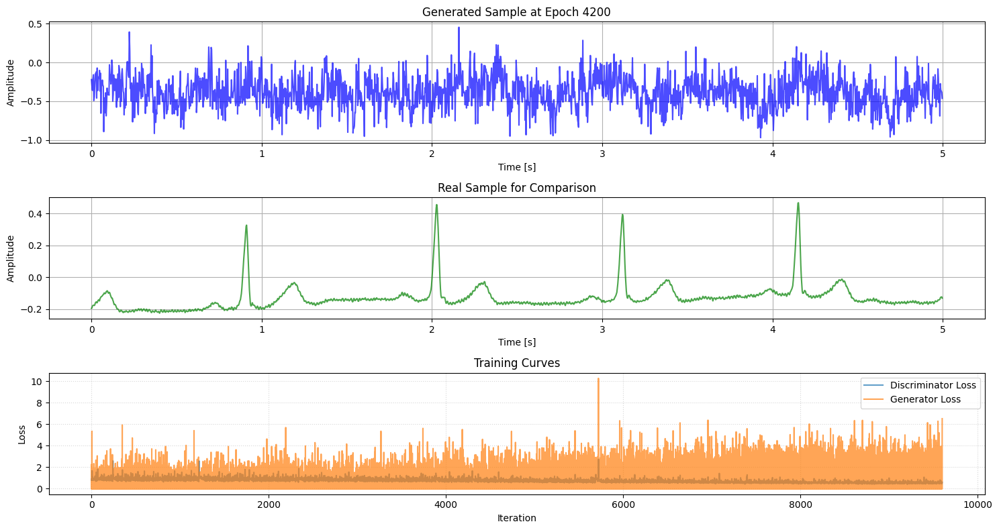

Epoch [4250/5000], D Loss: 0.4833, G Loss: 3.2499
Epoch [4300/5000], D Loss: 0.5412, G Loss: 3.9631


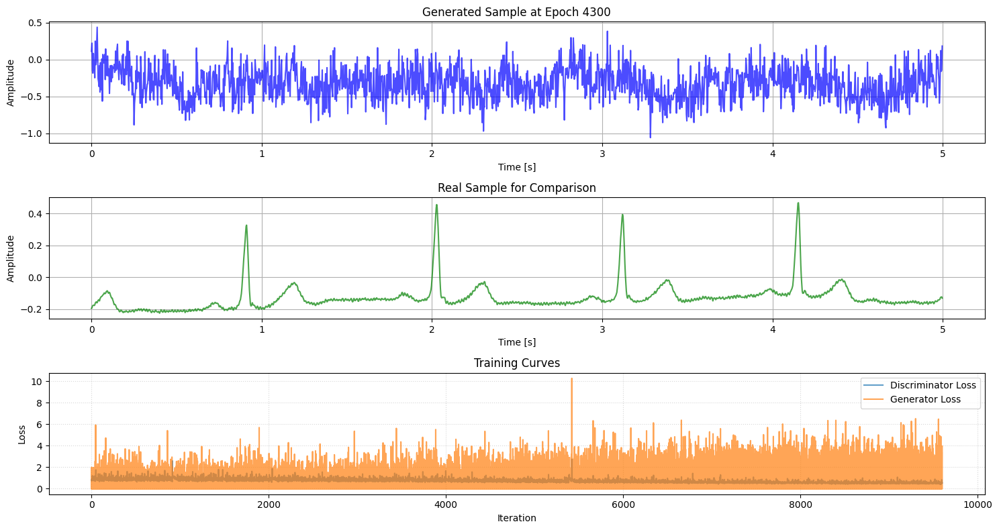

Epoch [4350/5000], D Loss: 0.5431, G Loss: 3.2989
Epoch [4400/5000], D Loss: 0.4805, G Loss: 3.4861


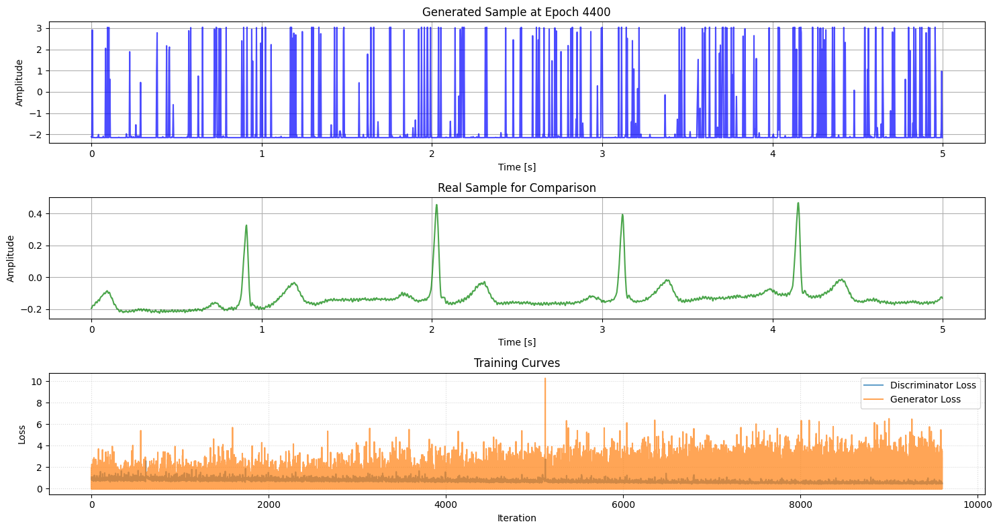

Epoch [4450/5000], D Loss: 0.4730, G Loss: 3.8441
Epoch [4500/5000], D Loss: 0.5186, G Loss: 3.9350


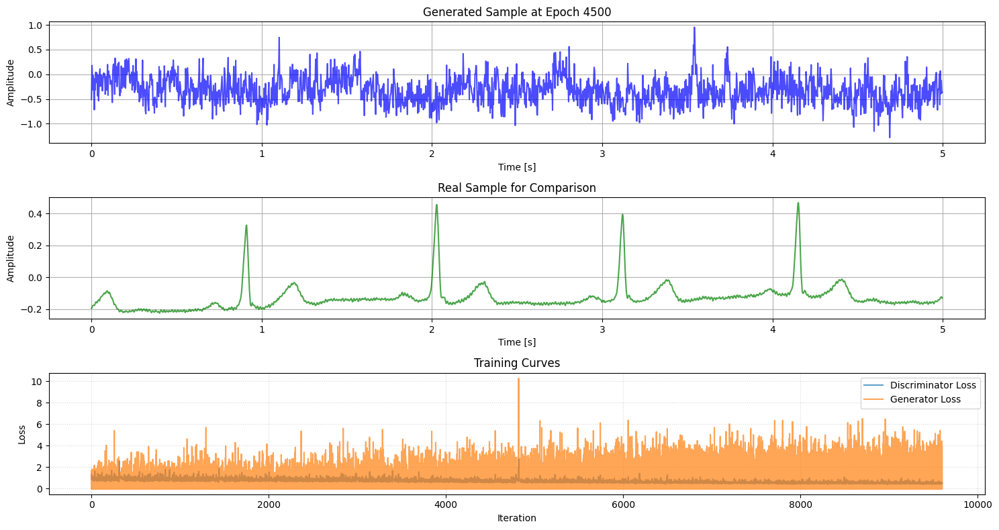

Epoch [4550/5000], D Loss: 0.4843, G Loss: 2.8886
Epoch [4600/5000], D Loss: 0.5089, G Loss: 3.4158


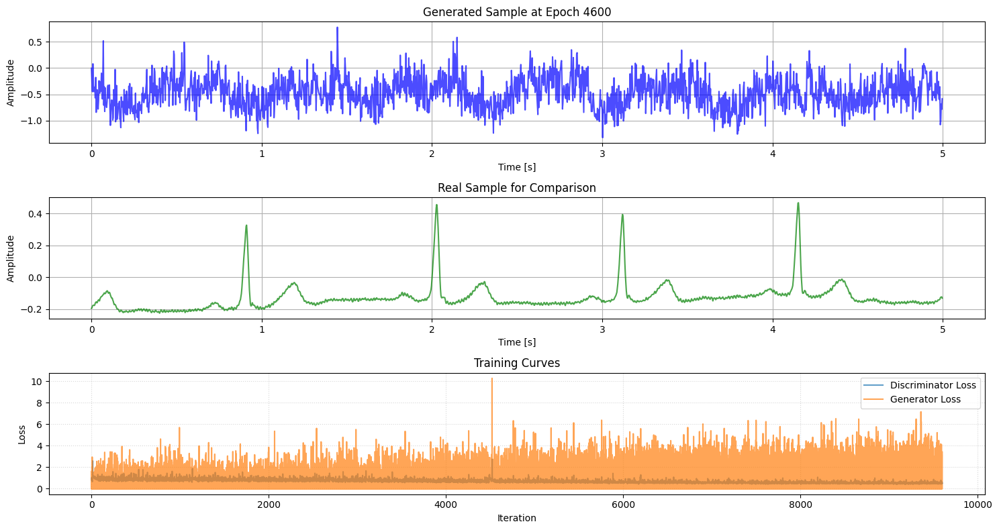

Epoch [4650/5000], D Loss: 0.4336, G Loss: 3.9936
Epoch [4700/5000], D Loss: 0.5860, G Loss: 2.9923


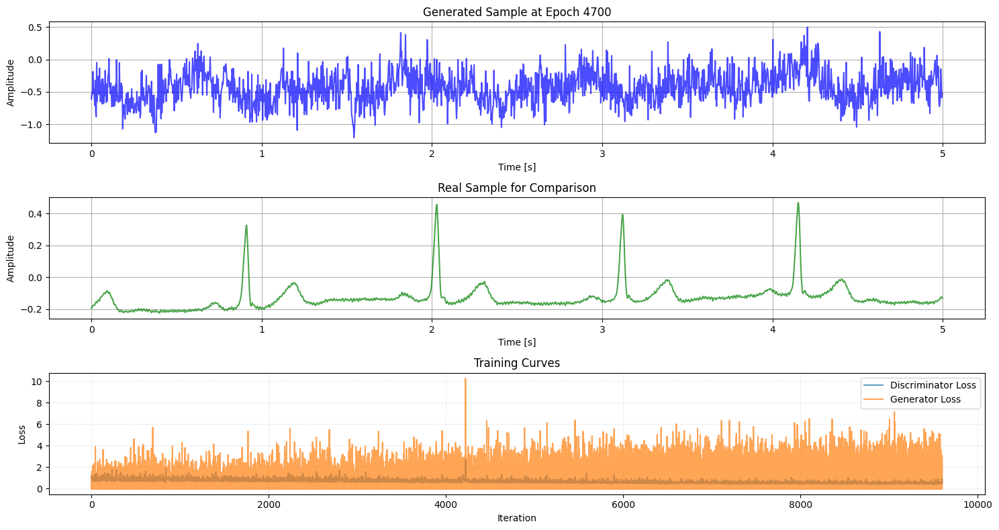

Epoch [4750/5000], D Loss: 0.5238, G Loss: 3.2446
Epoch [4800/5000], D Loss: 0.6054, G Loss: 1.6872


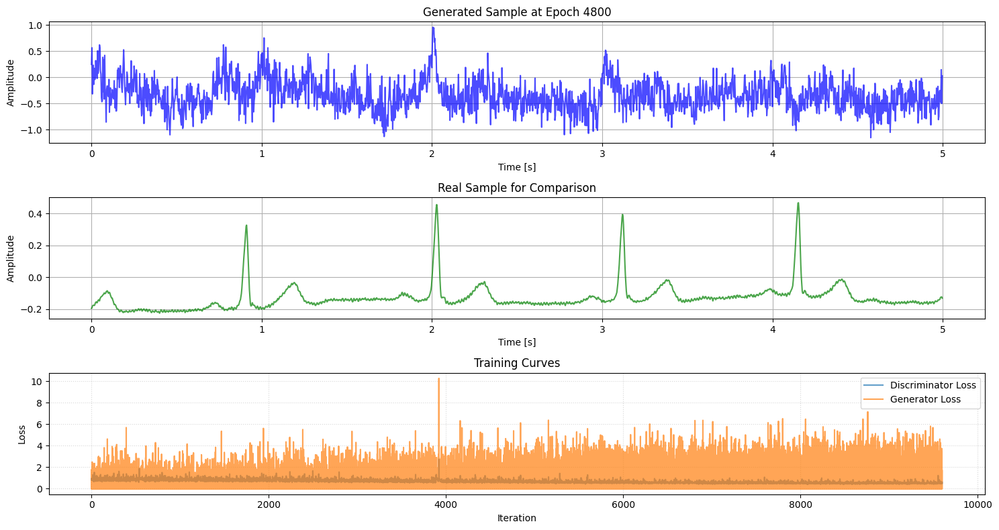

Epoch [4850/5000], D Loss: 0.4677, G Loss: 4.2135
Epoch [4900/5000], D Loss: 0.6031, G Loss: 3.9761


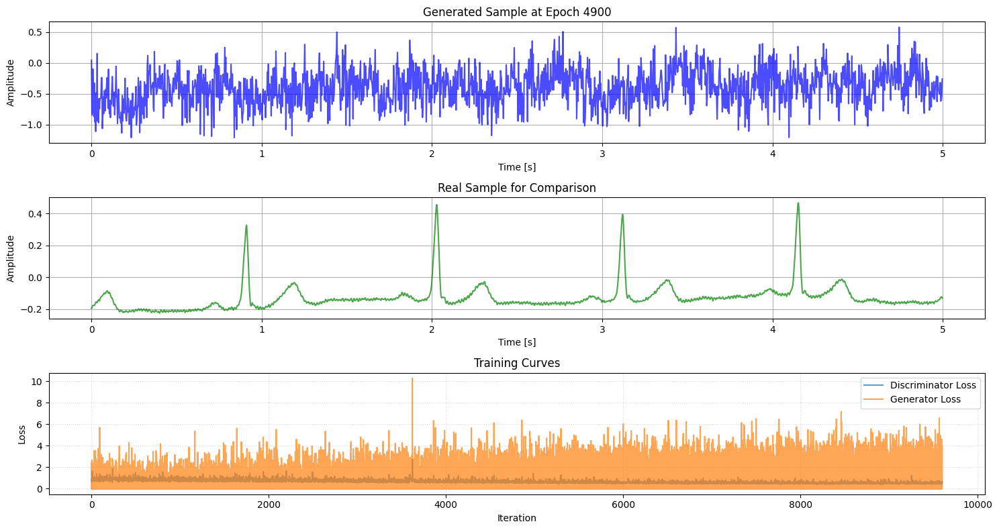

Epoch [4950/5000], D Loss: 0.4925, G Loss: 4.2164
Epoch [5000/5000], D Loss: 0.4873, G Loss: 4.2623


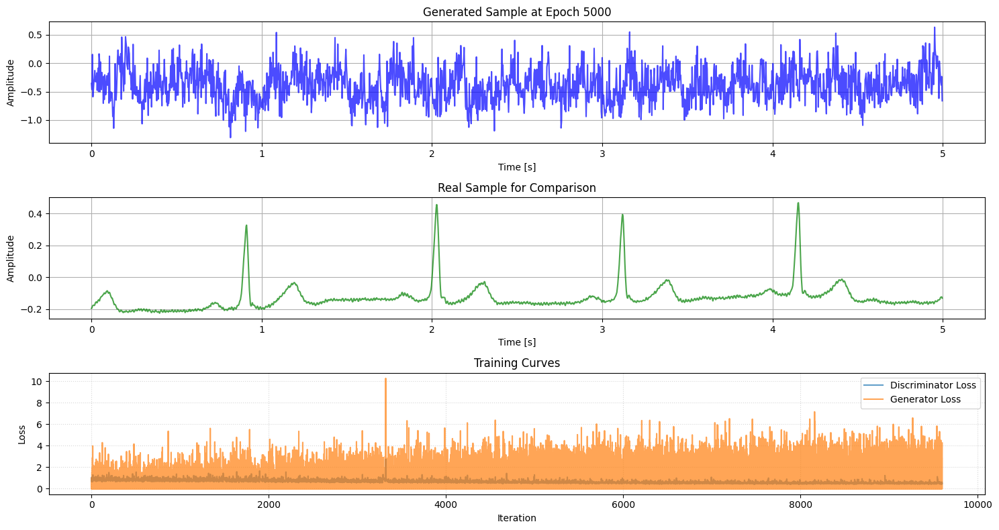

***************** Training finished!!! ****************


In [36]:
global noise_dim
noise_dim = 100  # Aumentado para más variabilidad

class Trainer:
    def __init__(self, generator, discriminator, g_optimizer, d_optimizer, criterion, device, n_critic=3):
        self.generator = generator
        self.discriminator = discriminator
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.criterion = criterion
        self.device = device
        self.n_critic = n_critic  # Entrenar D más veces que G
        self.d_steps = 0

    def train_step(self, real_data):
        batch_size = real_data.size(0)
        real_data = real_data.to(self.device)

        # Train Discriminator (con label smoothing)
        self.d_optimizer.zero_grad()

        # Real data (label smoothing: 0.9 en vez de 1.0)
        real_labels = torch.ones(batch_size, 1).to(self.device) * 0.9
        real_outputs = self.discriminator(real_data)
        d_loss_real = self.criterion(real_outputs, real_labels)

        # Fake data
        noise = torch.randn(batch_size, noise_dim).to(self.device)
        fake_data = self.generator(noise)
        fake_labels = torch.zeros(batch_size, 1).to(self.device)
        fake_outputs = self.discriminator(fake_data.detach())
        d_loss_fake = self.criterion(fake_outputs, fake_labels)

        # Total discriminator loss
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        self.d_optimizer.step()

        self.d_steps += 1

        # Train Generator (solo cada n_critic pasos)
        g_loss = torch.tensor(0.0)
        if self.d_steps % self.n_critic == 0:
            self.g_optimizer.zero_grad()
            noise = torch.randn(batch_size, noise_dim).to(self.device)
            fake_data = self.generator(noise)
            fake_outputs = self.discriminator(fake_data)
            g_loss = self.criterion(fake_outputs, real_labels)  # G quiere que D clasifique como real
            g_loss.backward()
            self.g_optimizer.step()

        return d_loss.item(), g_loss.item()

## Creacion del GAN vanilla mejorado

output_dim = X_dataset_normalized.shape[1]

generator = Generator(noise_dim=noise_dim, output_dim=output_dim).to(device)
discriminator = Discriminator(input_dim=output_dim).to(device)

# Inicializar pesos
generator.apply(weights_init)
discriminator.apply(weights_init)

# Learning rates diferenciados
g_optimizer = Adam(generator.parameters(), lr=0.0001, betas=(0.5, 0.999))
d_optimizer = Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

criterion = nn.BCEWithLogitsLoss()

trainer = Trainer(generator, discriminator, g_optimizer, d_optimizer, criterion, device, n_critic=3)

num_epochs = 5000  # Aumentado para mejor convergencia
g_errors = []
d_errors = []

EPOCHS_TO_PLOT = 100
LOSS_MAX_VIEW = batch_size * EPOCHS_TO_PLOT

# Usar datos normalizados
dataloader_normalized = get_dataloader(X_dataset_normalized, batch_size=batch_size, shuffle=True)

for epoch in range(num_epochs):
    for real_data in dataloader_normalized:
        d_loss, g_loss = trainer.train_step(real_data)
        d_errors.append(d_loss)
        g_errors.append(g_loss)

    if (epoch+1) % 50 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}')

    if (epoch+1) % EPOCHS_TO_PLOT == 0:
        plt.figure(figsize=(15, 8))
        generator.eval()
        with torch.no_grad():
            noise = torch.randn(1, noise_dim).to(device)
            generated_data = generator(noise).cpu().detach().numpy().reshape(-1)
            # Desnormalizar para comparar con datos originales
            generated_data_denorm = (generated_data + 1) / 2 * (X_max - X_min) + X_min
        generator.train()

        # Subplot 1: Señal generada
        plt.subplot(3, 1, 1)
        plt.plot(t, generated_data_denorm, color='blue', alpha=0.7)
        plt.xlabel('Time [s]')
        plt.ylabel('Amplitude')
        plt.title(f'Generated Sample at Epoch {epoch+1}')
        plt.grid()
        
        # Subplot 2: Señal real (para comparación)
        plt.subplot(3, 1, 2)
        plt.plot(t, X_dataset_normalized[0,:], color='green', alpha=0.7)
        plt.xlabel('Time [s]')
        plt.ylabel('Amplitude')
        plt.title('Real Sample for Comparison')
        plt.grid()

        # Subplot 3: Curvas de pérdida
        plt.subplot(3, 1, 3)
        plt.plot(d_errors[max(0, len(d_errors)-LOSS_MAX_VIEW):], label='Discriminator Loss', alpha=0.7)
        plt.plot(g_errors[max(0, len(g_errors)-LOSS_MAX_VIEW):], label='Generator Loss', alpha=0.7)
        plt.xlabel('Iteration')
        plt.ylabel('Loss')
        plt.title('Training Curves')
        plt.legend()
        plt.grid(ls=":", alpha=0.5)
        
        plt.tight_layout()
        plt.show()

print("***************** Training finished!!! ****************")